# SETUP

## Check environment

In [1]:
USE_GPU = True

## Libraries

In [2]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys
from pytz import timezone
import pathlib

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import joblib

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error, mean_absolute_percentage_error
from scipy.stats import pearsonr
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K
from tqdm.keras import TqdmCallback
from tensorflow.keras import optimizers

RESULT_DIR = f"/le_thanh_van_118/workspace/hiep_workspace/seq2seq_pm25_results/{datetime.now(timezone('Asia/Saigon')).strftime('%Y_%m_%d-%H_%M_%S')}"
pathlib.Path(RESULT_DIR).mkdir(parents=True, exist_ok=True)
print(RESULT_DIR)

# Append the custom libraries to system path
sys.path.append("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")
    os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = "true"

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_3_data, plot_prediction, plot_learning_curves
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction, inferenceLSTM
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData
from src.data_utils import mice
from src.time_series_utils import splitTrainValidationTestTimeSeries, reframePastFuture, padPastFuture

# Checking Tensorflow
print(f"Tensorflow version: {tf.__version__}, GPUs: {tf.config.list_physical_devices('GPU')}")

E0000 00:00:1764827406.265806   41478 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764827406.272248   41478 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764827406.288304   41478 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764827406.288324   41478 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764827406.288326   41478 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1764827406.288327   41478 computation_placer.cc:177] computation placer already registered. Please check linka

/le_thanh_van_118/workspace/hiep_workspace/seq2seq_pm25_results/2025_12_04-12_50_08
Using GPU to train
Tensorflow version: 2.19.1, GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# DATA FROM VIET

## Load dataset

In [3]:
dataset_path = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"

df_raw = []

for csv_file in sorted(glob.glob(f"{dataset_path}/*")):
    print(f"Working on {csv_file}")
    df_station = pd.read_csv(csv_file)
    df_station["station"] = int(os.path.splitext(os.path.basename(csv_file))[0])
    df_raw.append(df_station)
df_raw = pd.concat(df_raw, axis=0)

# Set time index
df_raw["date"] = pd.to_datetime(df_raw["date"])
df_raw.set_index("date", inplace=True)

# Drop columns
#features_to_use = ["pm25_quantrac", "tsp_quantrac", "station"]
#features_to_use = ["PM25_quantrac", "TSP_quantrac", "O3_quantrac", "CO_quantrac", "NO2_quantrac", "Temperature_quantrac", "Humid_quantrac", "station"]
features_to_use = ["PM25_quantrac", "TSP_quantrac", "station"]
df_raw = df_raw.loc[:, features_to_use]

df_raw

Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/211.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/212.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/213.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/214.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/215.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/216.csv


,PM25_quantrac,TSP_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


## Data preparation

### Drop missing

In [4]:
df = []
for station in sorted(df_raw["station"].unique()):
    df_station = df_raw[df_raw["station"] == station]
    df.append(df_station.dropna())
df = pd.concat(df, axis=0)
df

,PM25_quantrac,TSP_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


### Scale

In [5]:
df_scaled = copy.deepcopy(df)

# Scale label
label = "PM25_quantrac"
label_scaler = MinMaxScaler()
df_scaled[label] = label_scaler.fit_transform(df[[label]])

# Scale features
features_to_scale = features_to_use
features_to_scale.remove(label)
for f in features_to_scale:
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df[[f]])
    df_scaled[f] = scaled_data

# Drop station column
df_scaled = df_scaled.drop(columns=["station"], errors="ignore")

df_scaled

,PM25_quantrac,TSP_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


### Train test split

In [6]:
splitter = round(0.8 * len(df_scaled))
train_data = df_scaled.iloc[:splitter]
test_data = df_scaled.iloc[splitter:]

display(train_data)
display(test_data)

,PM25_quantrac,TSP_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2021-09-21 06:00:00,0.059110,0.052214
2021-09-21 07:00:00,0.065058,0.058590
2021-09-21 08:00:00,0.067930,0.060540


,PM25_quantrac,TSP_quantrac
date,,
2021-09-21 11:00:00,0.065315,0.057731
2021-09-21 12:00:00,0.059551,0.050703
2021-09-21 13:00:00,0.058597,0.048018
2021-09-21 14:00:00,0.053520,0.039493
2021-09-21 15:00:00,0.064546,0.053170
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


## Prediction

### Model paramaters

In [7]:
n_past = 168

epochs = 100
batch_size = 128

In [8]:
# Calculate MNBE
def mean_normalized_bias_error(y_pred, y_actual):
    y_pred = np.array(y_pred)
    y_actual = np.array(y_actual)
    return np.mean((y_pred - y_actual) / np.mean(y_actual)) * 100

metrics_calculators = {
    "mae": mean_absolute_error,
    "mse": mean_squared_error,
    "rmse": root_mean_squared_error,
    "r2": r2_score,
    "mape": mean_absolute_percentage_error,
    "mnbe": mean_normalized_bias_error,
    "r_coeff": lambda a,b: pearsonr(a, b)[0]
}

### Reframe data

In [9]:
# Function to reframe data
def reframe(input_data, n_past, n_future, n_shifted=0):
    data = copy.deepcopy(input_data)
    m = np.arange(0, len(data) - n_past - n_future - n_shifted + 1)
    X = np.array([data.iloc[i:(i + n_past), :] for i in m])
    label_index_col = 0
    y = np.expand_dims(np.array([data.iloc[(i + n_shifted + n_past):(i + n_shifted + n_past + n_future), 0] for i in m]), -1)
    return X, y

X_train_48h, y_train_48h = reframe(train_data, n_past, 48)
X_test_48h, y_test_48h = reframe(test_data, n_past, 48)
print(X_train_48h.shape, y_train_48h.shape, X_test_48h.shape, y_test_48h.shape)

(39723, 168, 2) (39723, 48, 1) (9770, 168, 2) (9770, 48, 1)


### Define callbacks

In [10]:
reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)
early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, restore_best_weights=True),

### LSTM-Seq2Seq

In [11]:
def define_lstms2s_model(n_past, n_future, n_features, n_label, name="model"):
    inputs = Input(shape=(n_past, n_features))
    lstm_1 = LSTM(128, return_sequences=True, activation="relu")(inputs)
    lstm_2 = LSTM(64, activation="relu", dropout=0.2)(lstm_1)
    dense = Dense(32, activation="relu")(lstm_2)
    outputs = Dense(n_future)(dense)

    # Compile the model
    model = Model(inputs, outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanAbsoluteError())
    display(model.summary())
    return model

#### 48 hours

I0000 00:00:1764827418.944857   41478 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 37945 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


Model: "PM25_quantrac_lstms2s_48h"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 168, 2)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 168, 128)       │        67,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 48)             │         1,584 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 120,144 (469.31 KB)

 Trainable params: 120,144 (469.31 KB)

 Non-trainable params: 0 (0.00 B)

None

Epoch 1/100


I0000 00:00:1764827422.181843   41706 service.cc:152] XLA service 0x76cd0c00c650 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764827422.181870   41706 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
I0000 00:00:1764827422.794143   41706 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/249 ━━━━━━━━━━━━━━━━━━━━ 1:24:59 21s/step - loss: 0.1438

I0000 00:00:1764827440.465404   41706 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


249/249 ━━━━━━━━━━━━━━━━━━━━ 83s 254ms/step - loss: 0.0539 - val_loss: 0.0300 - learning_rate: 0.0010
Epoch 2/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 57s 231ms/step - loss: 0.0508 - val_loss: 0.0292 - learning_rate: 0.0010
Epoch 3/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 57s 229ms/step - loss: 0.0497 - val_loss: 0.0301 - learning_rate: 0.0010
Epoch 4/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 235ms/step - loss: 0.0489 - val_loss: 0.0305 - learning_rate: 0.0010
Epoch 5/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.0478 - val_loss: 0.0301 - learning_rate: 0.0010
Epoch 6/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 231ms/step - loss: 0.0474 - val_loss: 0.0299 - learning_rate: 0.0010
Epoch 7/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step - loss: 0.0449
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 0.0468 - val_loss: 0.0295 - learning_rate: 0.0010
Epoch 8/100
249/249 ━━━━━━━━━━━━━━━━━━━━ 58s 232ms/step - loss: 0.0458 - val_los

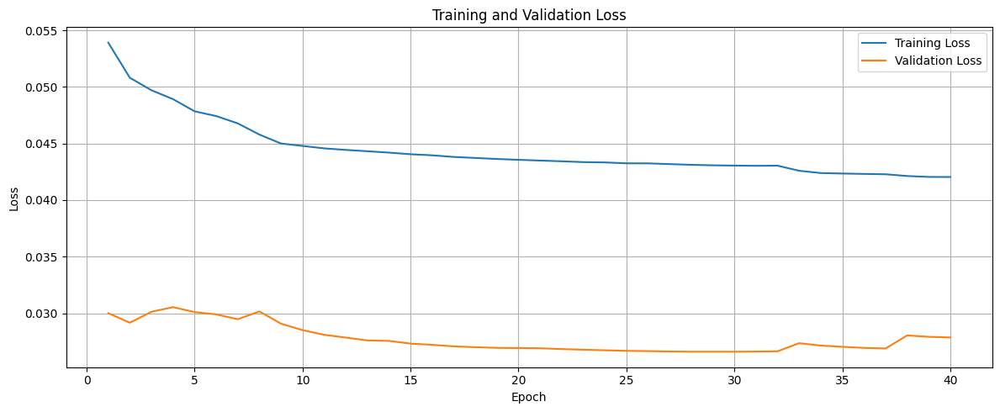

306/306 ━━━━━━━━━━━━━━━━━━━━ 8s 23ms/step
y_pred.shape = (9770, 48)
inv_y_pred.shape = (9770, 48, 1)
inv_y_test.shape = (9770, 48, 1)
Day = 0
mae: 4.122377419672591
mse: 24.17938602003602
rmse: 4.917253910470357
r2: 0.2683834209910547
mape: 0.2552160346330276
mnbe: -19.74026326648211
r_coeff: [0.96509054]


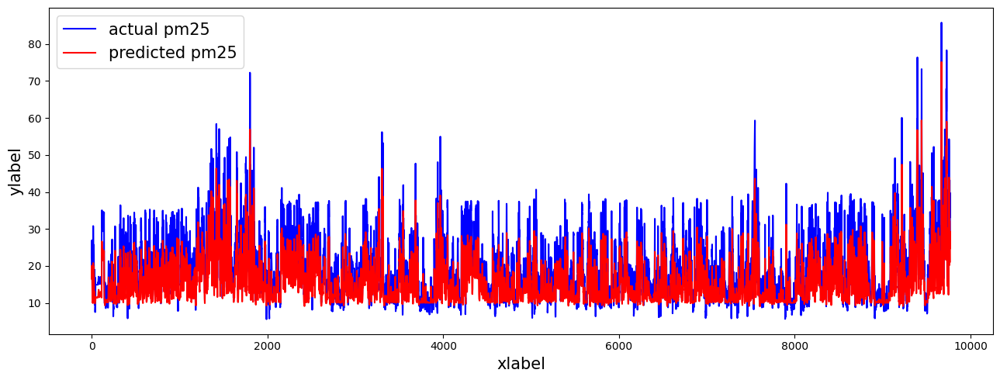

Day = 1
mae: 4.501020666912811
mse: 38.4153888209089
rmse: 6.198014909703662
r2: -0.5126832655047424
mape: 0.27926955220120314
mnbe: -19.011517060785284
r_coeff: [0.82643928]


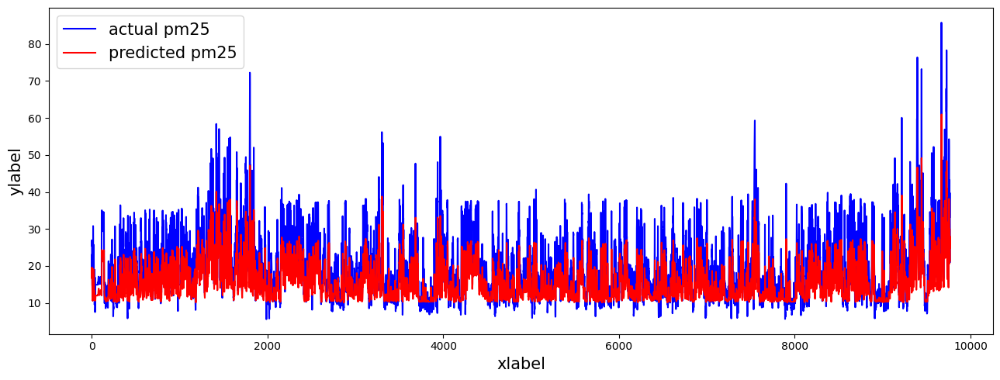

Day = 2
mae: 5.14461830431284
mse: 53.17164610867852
rmse: 7.2918890631083055
r2: -1.8066777530581914
mape: 0.3325437282309091
mnbe: -21.370388137274084
r_coeff: [0.71167964]


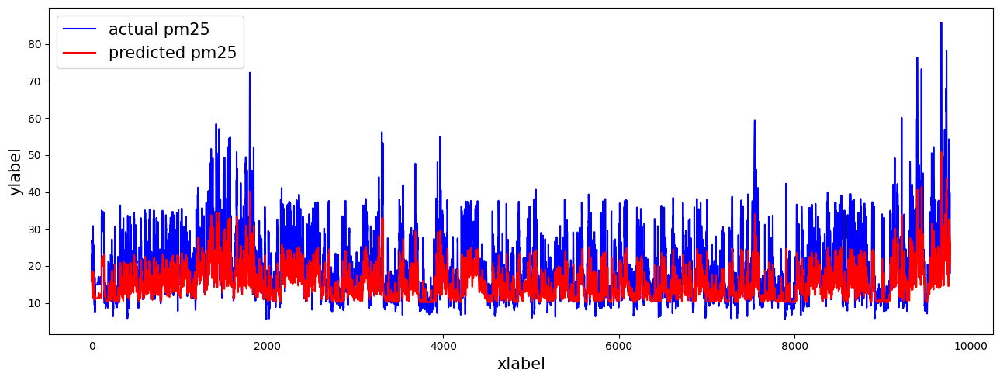

Day = 3
mae: 5.3195702110181715
mse: 58.55979463406104
rmse: 7.652437169559842
r2: -2.743057059943018
mape: 0.3424982103686409
mnbe: -20.40868838498786
r_coeff: [0.62792741]


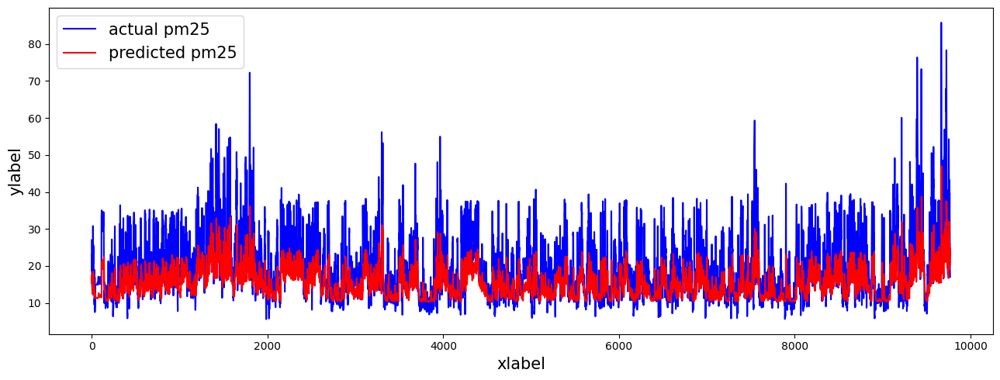

Day = 4
mae: 5.534568256827789
mse: 64.25845223658943
rmse: 8.016136989634685
r2: -4.2420428083335295
mape: 0.3590112772961686
mnbe: -20.577617074063706
r_coeff: [0.55714728]


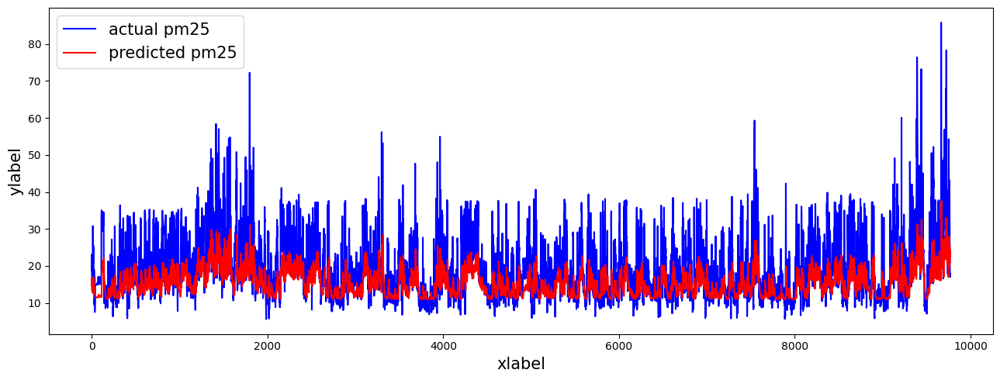

Day = 5
mae: 5.609765482504875
mse: 65.8454865861485
rmse: 8.114523189081938
r2: -4.142053945770492
mape: 0.36582374476773943
mnbe: -20.018987742475936
r_coeff: [0.51345967]


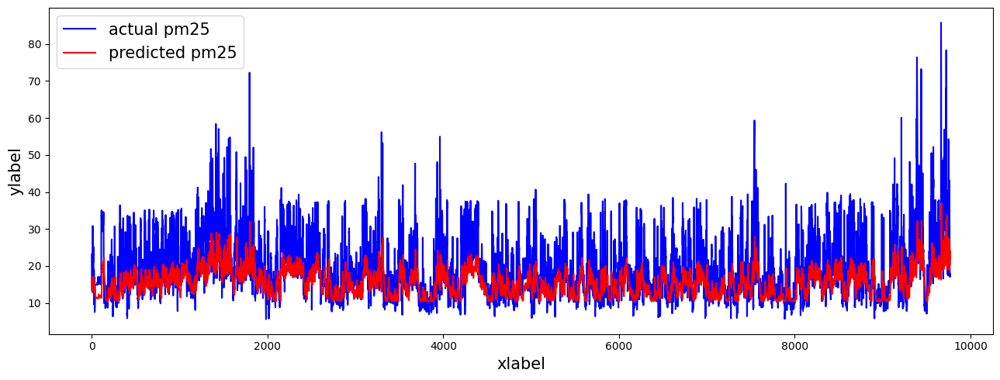

Day = 6
mae: 5.665893102792437
mse: 67.30470464211831
rmse: 8.203944456303828
r2: -4.9360256112267935
mape: 0.36620603466693474
mnbe: -19.228718089585072
r_coeff: [0.4726773]


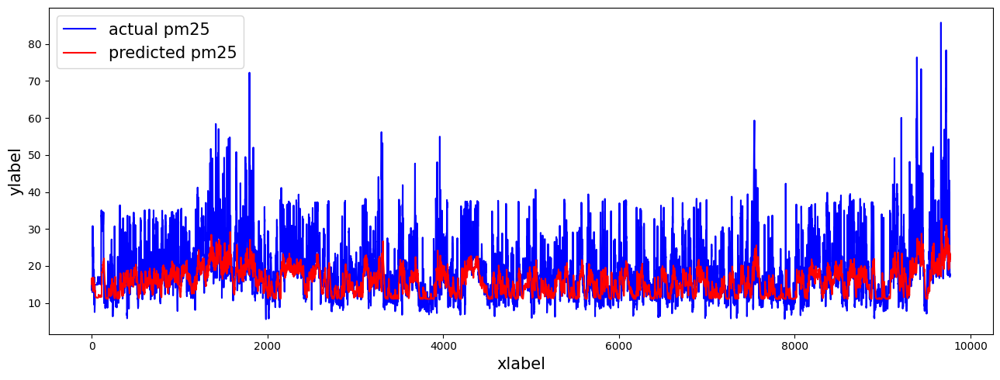

Day = 7
mae: 5.7532238640009155
mse: 69.47611028276795
rmse: 8.335233067093442
r2: -5.602039191746142
mape: 0.375144714124476
mnbe: -19.802644600435098
r_coeff: [0.45050942]


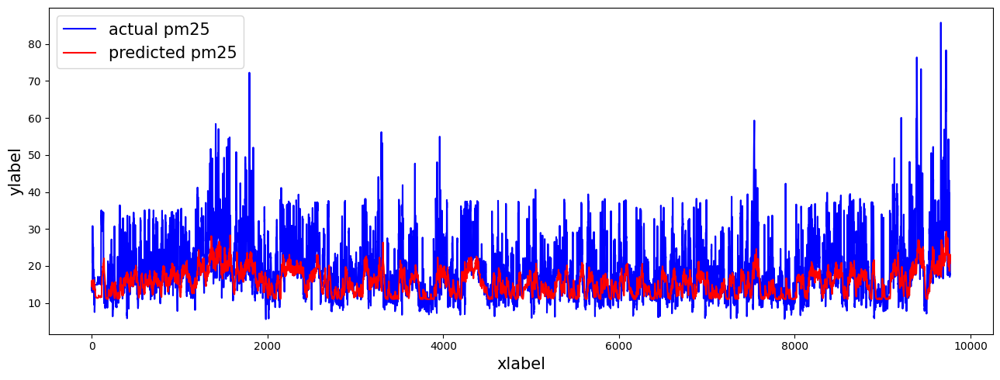

Day = 8
mae: 5.8174148196954
mse: 70.69975077153259
rmse: 8.408314383485704
r2: -5.36901194911239
mape: 0.3820105257544443
mnbe: -19.803641916734747
r_coeff: [0.42718652]


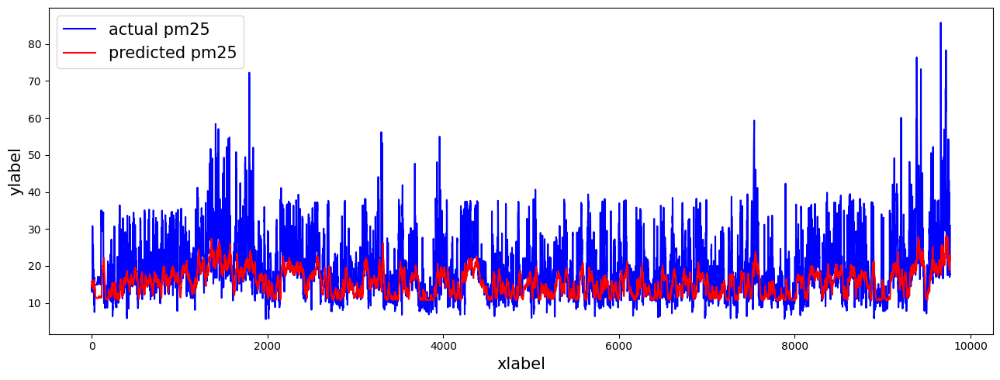

Day = 9
mae: 5.7932549247392044
mse: 70.18791998833842
rmse: 8.377823105576915
r2: -5.602582357771179
mape: 0.3753837779756545
mnbe: -18.893699839080764
r_coeff: [0.41405788]


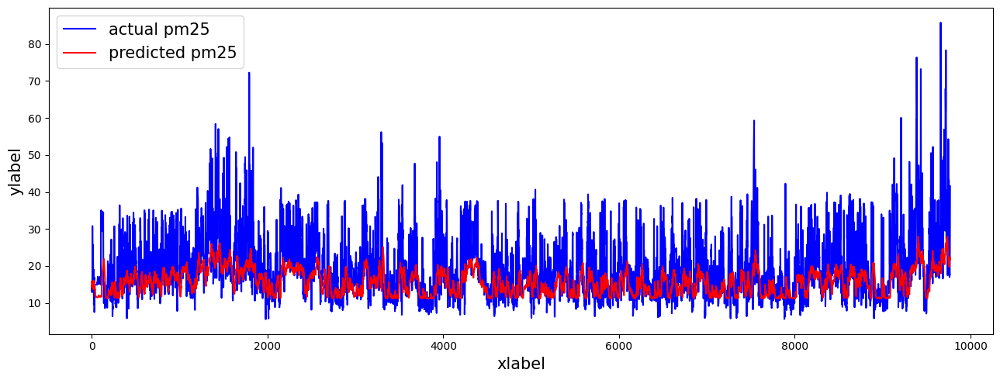

Day = 10
mae: 5.820843023666567
mse: 70.86351567754957
rmse: 8.418047022768974
r2: -6.166412397214976
mape: 0.37596162397444466
mnbe: -18.82341650576247
r_coeff: [0.40221171]


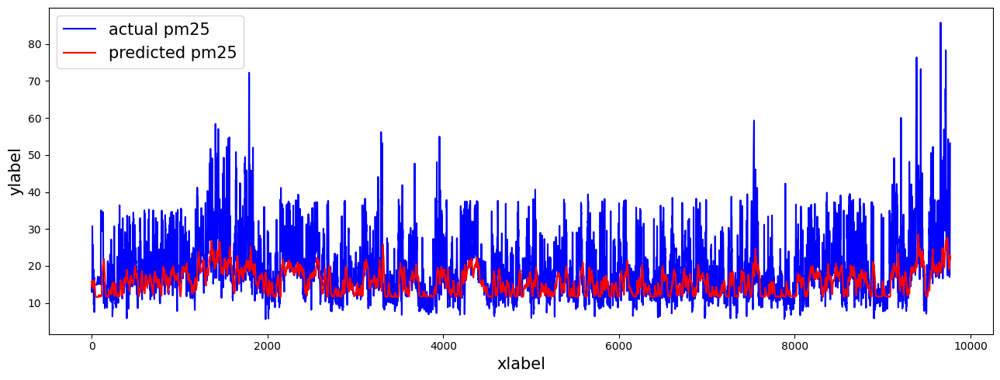

Day = 11
mae: 5.818682641945184
mse: 70.29721895729918
rmse: 8.38434368077187
r2: -5.806882069268242
mape: 0.3727543122560691
mnbe: -18.148521947445683
r_coeff: [0.39718891]


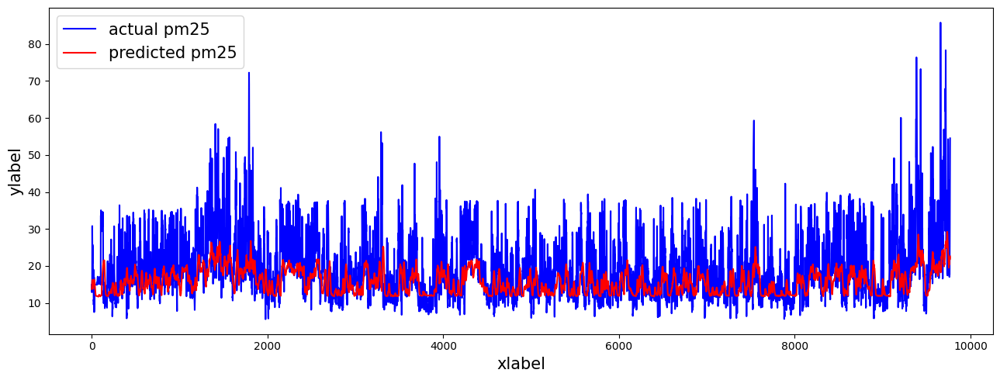

Day = 12
mae: 5.876513555047131
mse: 71.40705407601125
rmse: 8.450269467656712
r2: -5.434564237893011
mape: 0.3810129004318737
mnbe: -18.59476263623777
r_coeff: [0.39014211]


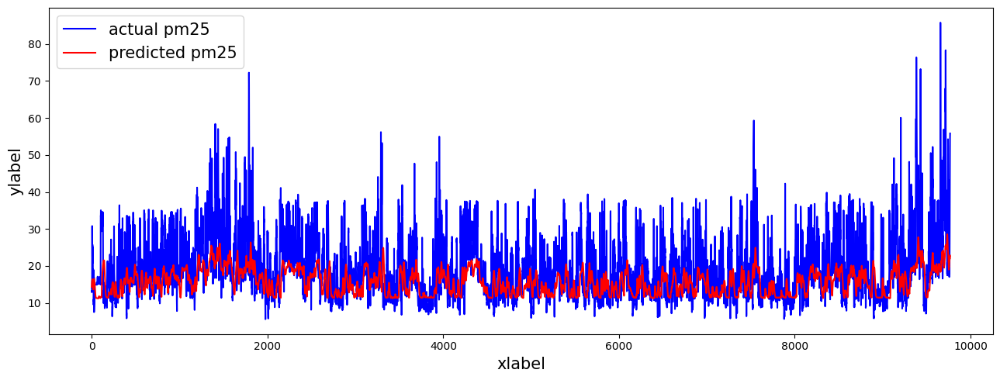

Day = 13
mae: 5.844906819481588
mse: 70.70310500298913
rmse: 8.408513840328096
r2: -5.351512796500361
mape: 0.37565483200248706
mnbe: -18.14716270039351
r_coeff: [0.3936655]


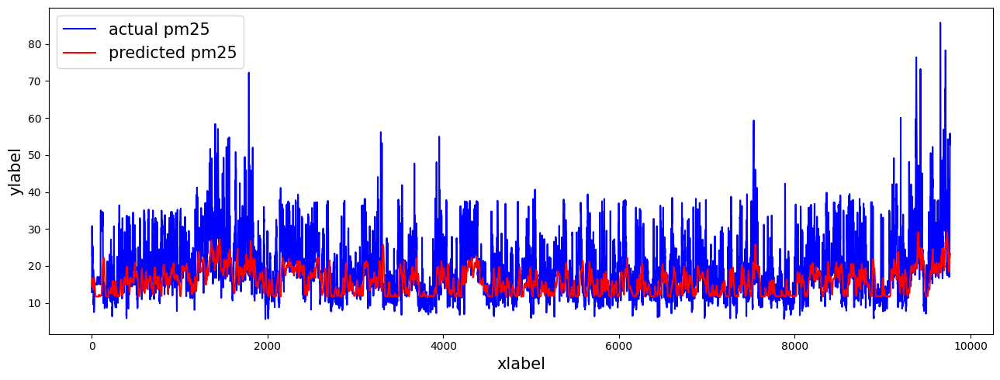

Day = 14
mae: 5.8494844079372985
mse: 70.02217445298868
rmse: 8.367925337441095
r2: -4.3348708313968745
mape: 0.37257417572093476
mnbe: -16.769166607021457
r_coeff: [0.37850644]


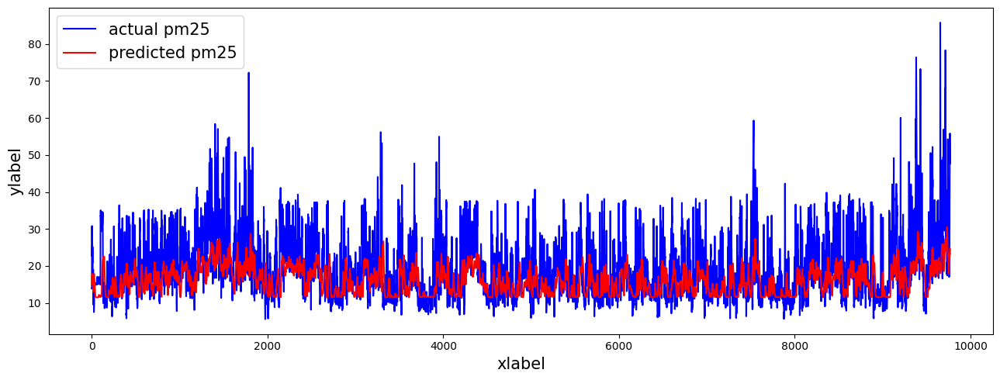

Day = 15
mae: 5.821369299761465
mse: 69.92026619240083
rmse: 8.36183390126836
r2: -5.263069764739805
mape: 0.3679651162555243
mnbe: -17.026403640010283
r_coeff: [0.38345684]


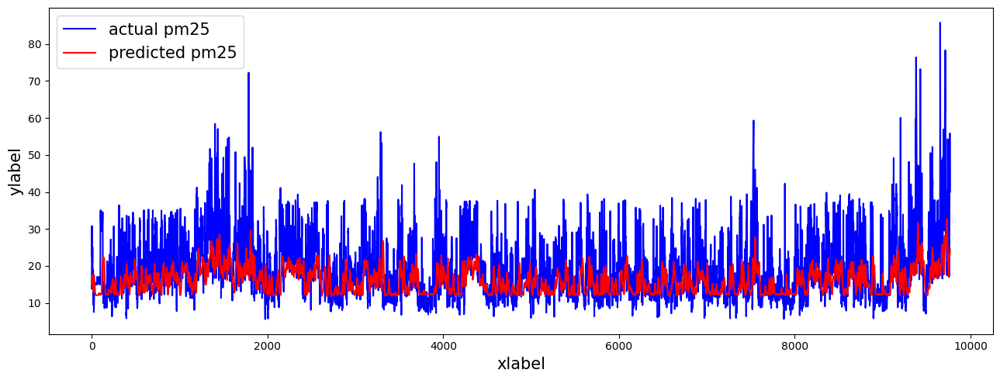

Day = 16
mae: 5.808513344318398
mse: 69.6467732194049
rmse: 8.345464230311272
r2: -5.410874732925847
mape: 0.3671099043114437
mnbe: -17.063199240469128
r_coeff: [0.38936531]


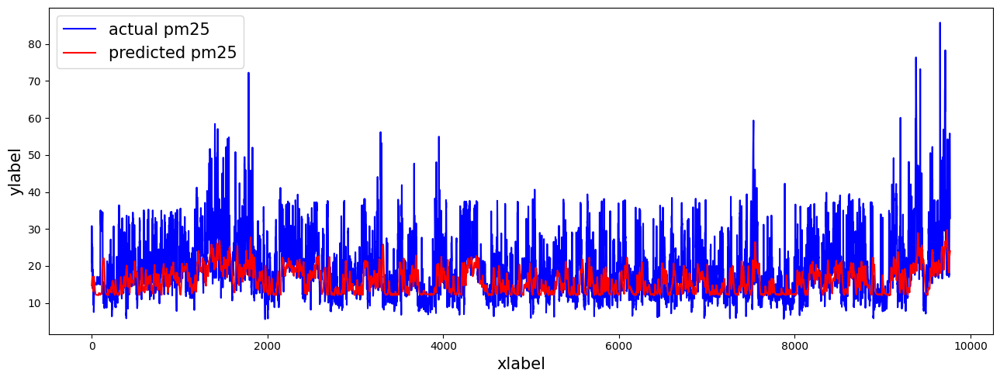

Day = 17
mae: 5.874612095918505
mse: 70.7262617885364
rmse: 8.409890712044742
r2: -4.341997498923411
mape: 0.377104272136681
mnbe: -17.44975220143358
r_coeff: [0.38232473]


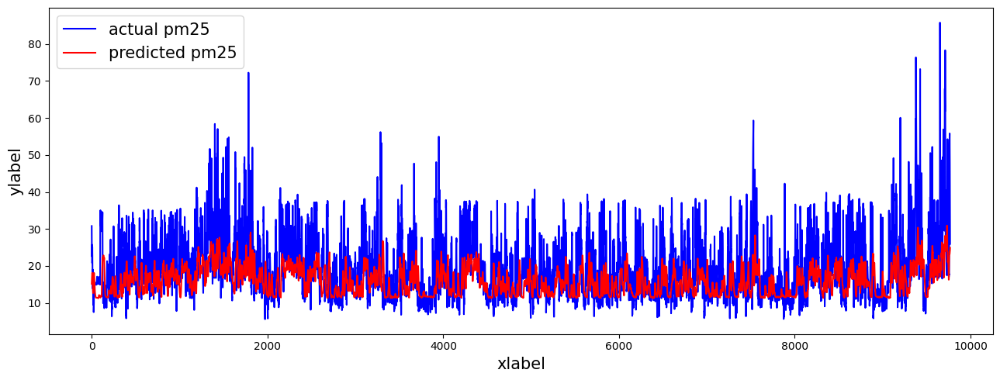

Day = 18
mae: 5.8080658815918085
mse: 69.3755988014376
rmse: 8.32920157046506
r2: -4.529833647927219
mape: 0.3665534687861553
mnbe: -16.587637917674915
r_coeff: [0.38526129]


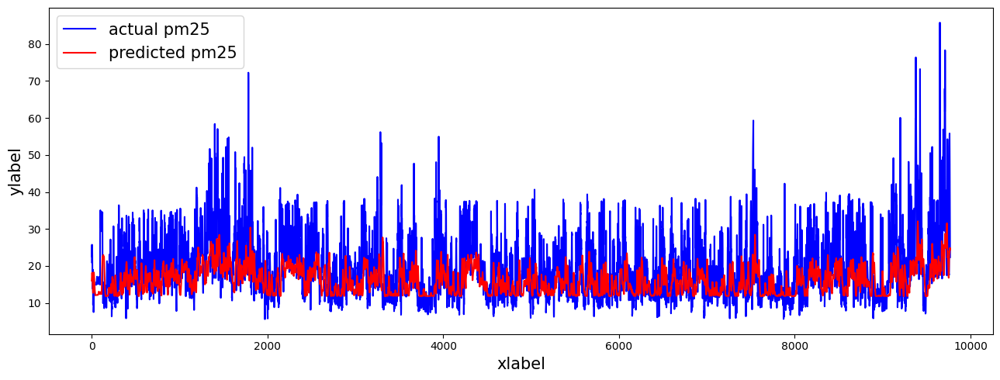

Day = 19
mae: 5.800296036831109
mse: 69.27142714960412
rmse: 8.322945821618937
r2: -4.799111909474663
mape: 0.36546011145673235
mnbe: -16.70934918236724
r_coeff: [0.3890425]


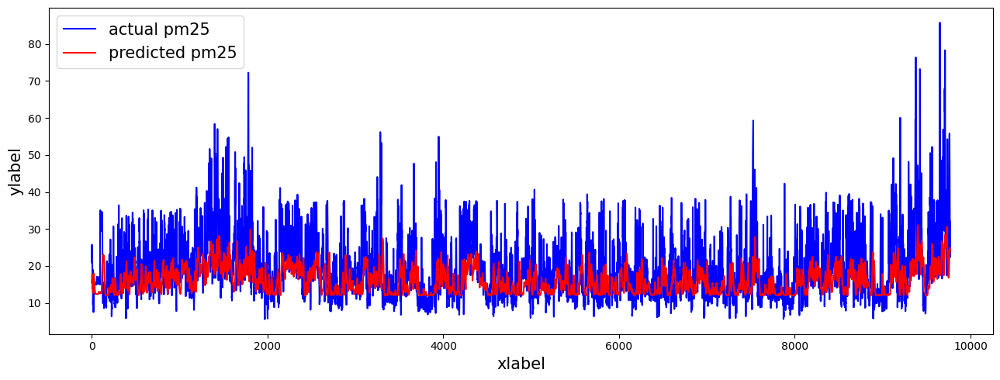

Day = 20
mae: 5.882850639184874
mse: 71.12518395225878
rmse: 8.433574802671687
r2: -4.489148892321958
mape: 0.3773209692457061
mnbe: -17.685442317326334
r_coeff: [0.38058362]


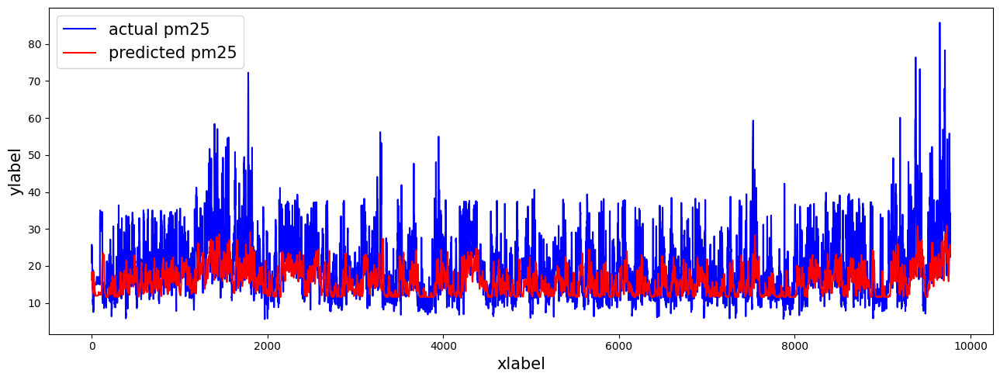

Day = 21
mae: 5.86873939861525
mse: 70.65238690956413
rmse: 8.405497421899797
r2: -4.356268285809178
mape: 0.374402404821117
mnbe: -17.061142564185282
r_coeff: [0.3762258]


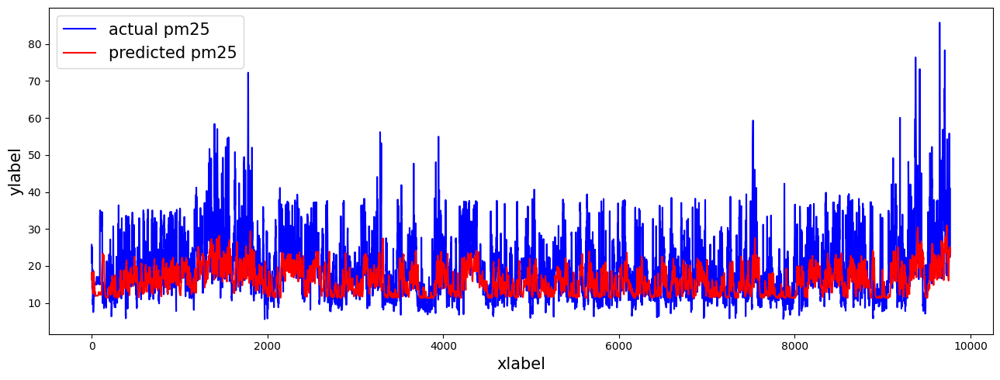

Day = 22
mae: 5.916967391268668
mse: 72.23431497749897
rmse: 8.499077301536854
r2: -5.180707465150776
mape: 0.3809418388439234
mnbe: -18.345730008979054
r_coeff: [0.37642927]


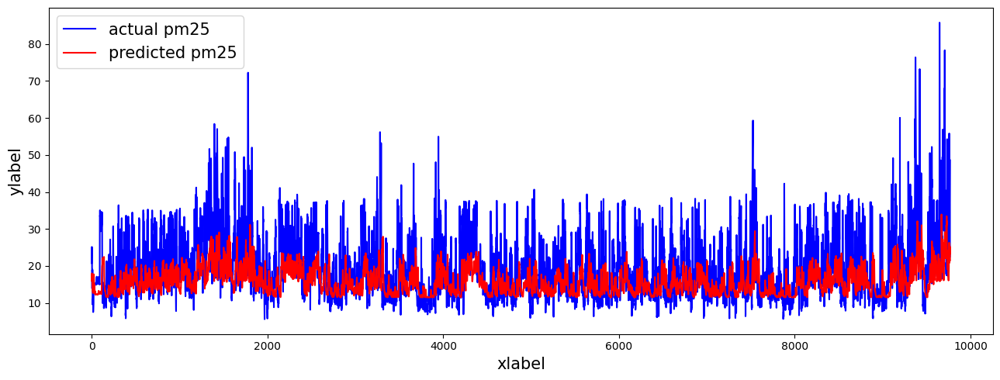

Day = 23
mae: 5.960477699380164
mse: 72.93939550814032
rmse: 8.540456399288058
r2: -5.0522730795351505
mape: 0.3850266009360721
mnbe: -18.430147705112194
r_coeff: [0.36683202]


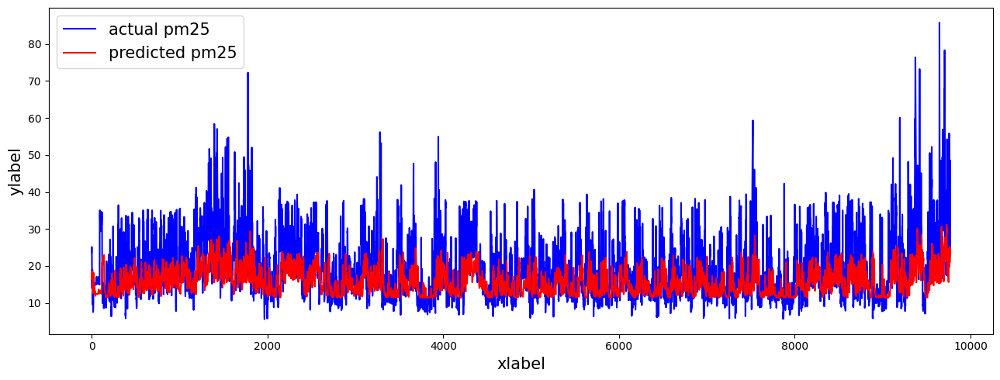

Day = 24
mae: 6.000457865342237
mse: 72.66053567454276
rmse: 8.524114949632176
r2: -4.466047321688334
mape: 0.3865198329181133
mnbe: -17.257928822258428
r_coeff: [0.34880353]


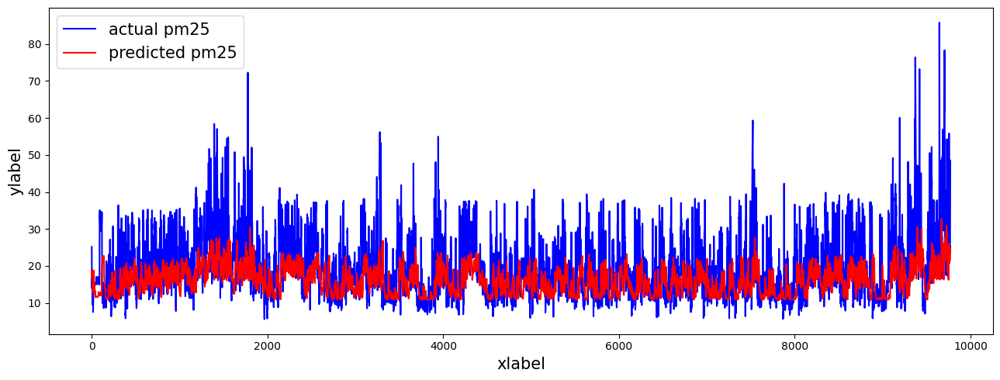

Day = 25
mae: 5.994772531230478
mse: 73.12289364160179
rmse: 8.551192527454974
r2: -6.2513035354798205
mape: 0.3827654298296629
mnbe: -17.761607451465572
r_coeff: [0.34363529]


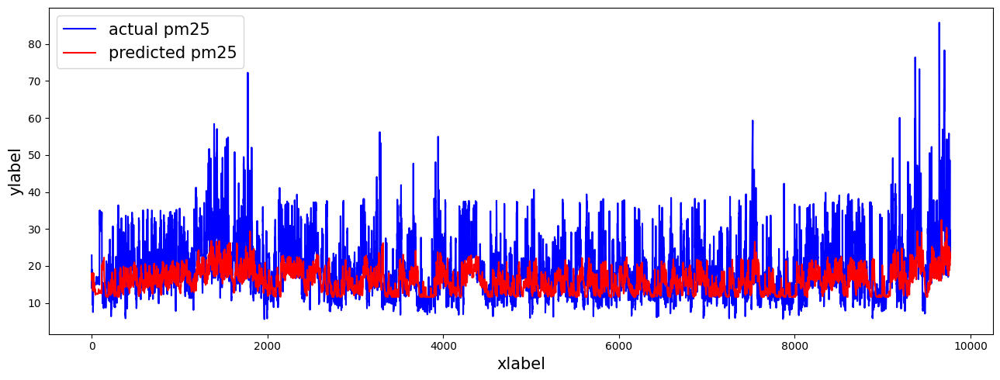

Day = 26
mae: 6.05252965446649
mse: 74.56132993224273
rmse: 8.634890267527592
r2: -6.97882661188059
mape: 0.38988935274036535
mnbe: -18.27914844683984
r_coeff: [0.3277897]


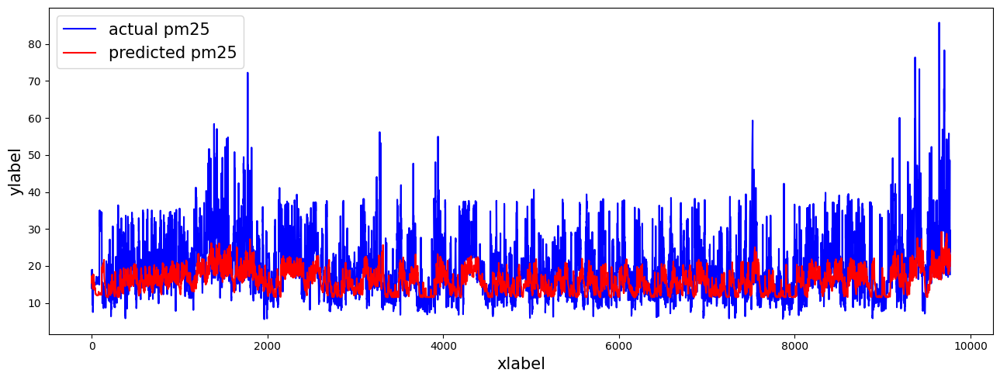

Day = 27
mae: 5.9650248699552035
mse: 72.14714490922769
rmse: 8.493947545707337
r2: -7.901589753487359
mape: 0.3710898632150623
mnbe: -15.90888929588122
r_coeff: [0.31343404]


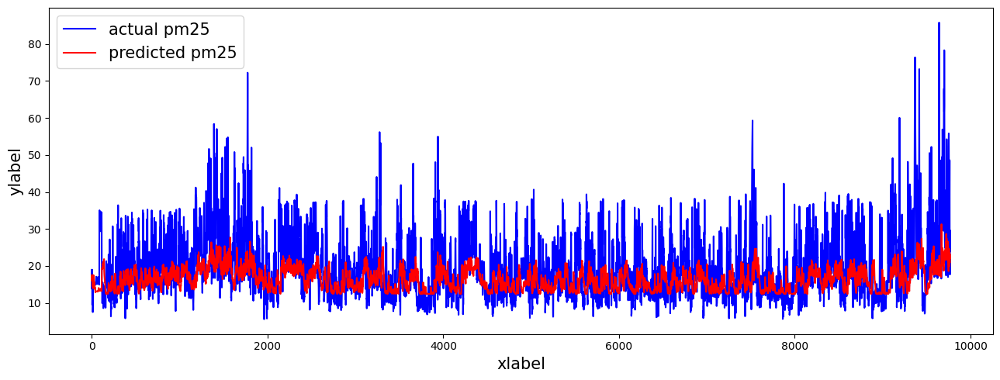

Day = 28
mae: 6.052324995997311
mse: 73.62234723858315
rmse: 8.5803465686756
r2: -6.352431974505326
mape: 0.3819345643179017
mnbe: -15.872627160989452
r_coeff: [0.28937908]


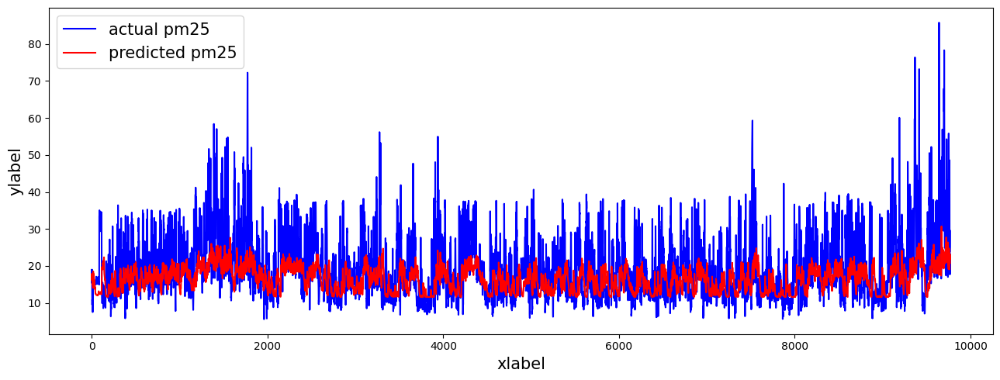

Day = 29
mae: 5.996621141548083
mse: 73.00986951349674
rmse: 8.544581295388133
r2: -8.653994876853655
mape: 0.3727735215160632
mnbe: -15.598304325016466
r_coeff: [0.28594718]


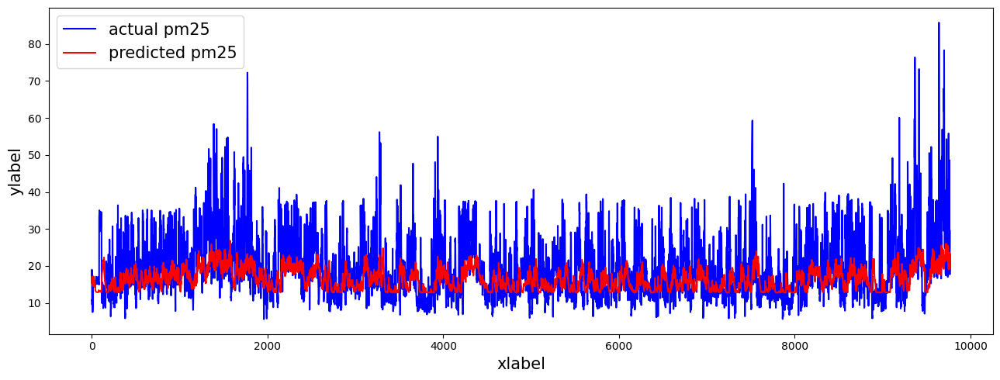

Day = 30
mae: 6.066787582135262
mse: 74.0276132615649
rmse: 8.603930105571807
r2: -7.587886680107939
mape: 0.3808147188326783
mnbe: -15.509884492064963
r_coeff: [0.26656389]


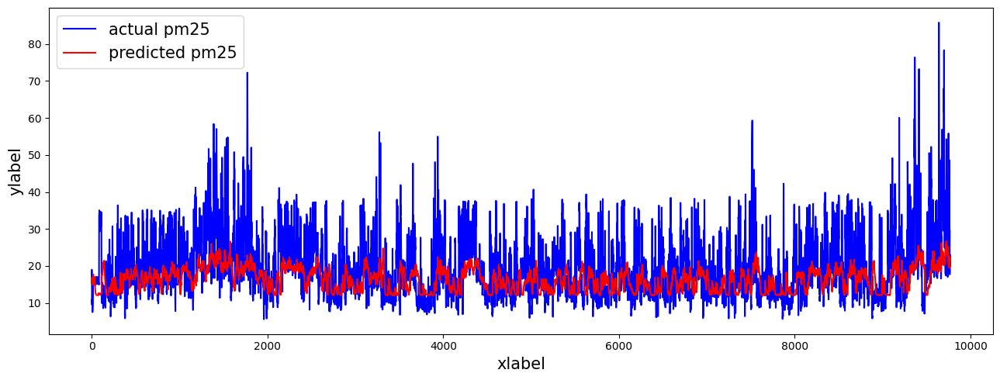

Day = 31
mae: 6.081243426557529
mse: 74.01302845111486
rmse: 8.603082497053883
r2: -6.93522737952031
mape: 0.3828587698279759
mnbe: -15.414144611359145
r_coeff: [0.26825879]


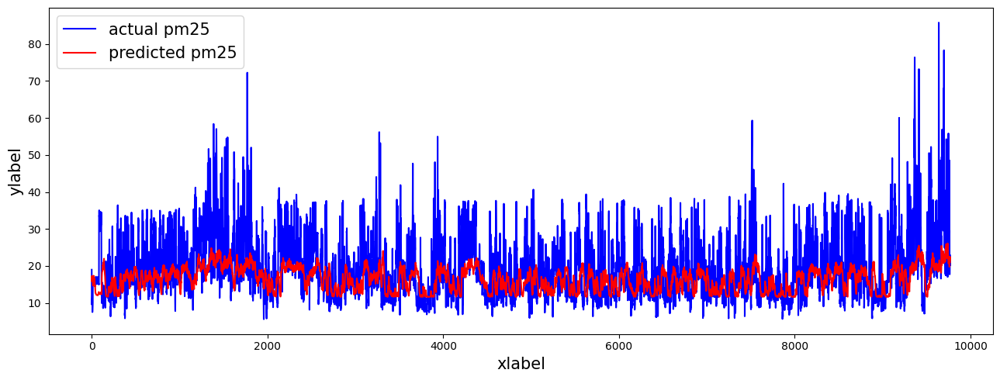

Day = 32
mae: 6.05477967446021
mse: 74.0819112888523
rmse: 8.607084947231106
r2: -8.279878387708107
mape: 0.3811630803741834
mnbe: -16.15029929421321
r_coeff: [0.27831977]


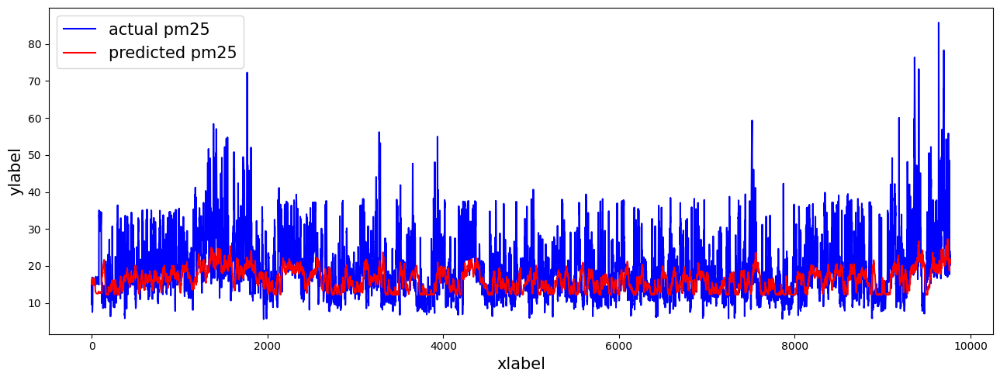

Day = 33
mae: 6.044756251881948
mse: 73.70578008645508
rmse: 8.585207049713773
r2: -8.687140802568425
mape: 0.3775774743466518
mnbe: -15.728789421608603
r_coeff: [0.27435299]


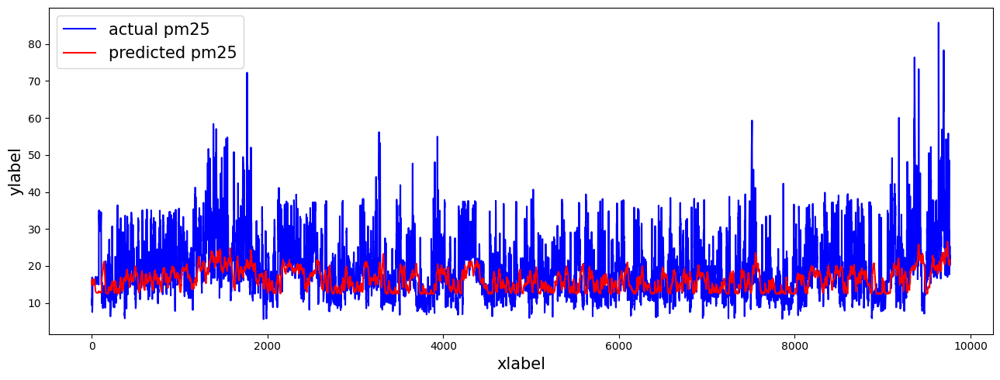

Day = 34
mae: 6.096039596663798
mse: 74.19268908762386
rmse: 8.613517811418507
r2: -6.862633867854867
mape: 0.38252314139256
mnbe: -15.072890162141823
r_coeff: [0.25794998]


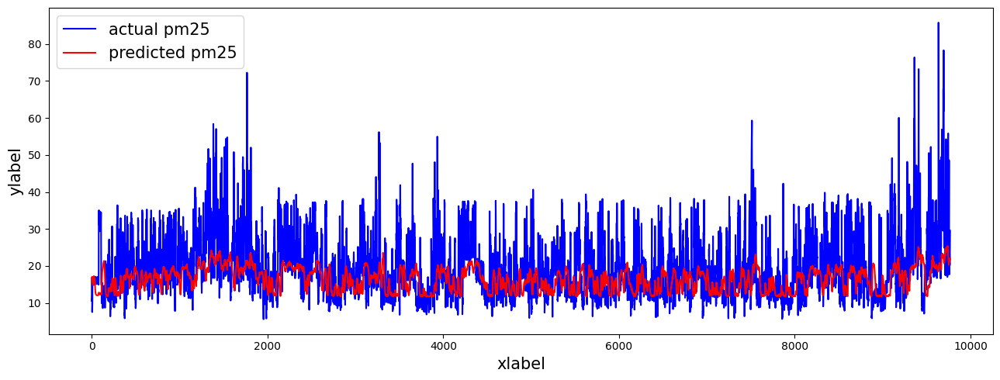

Day = 35
mae: 6.054349767666029
mse: 74.27445802479853
rmse: 8.618263051497008
r2: -9.767344332119272
mape: 0.3775739754497909
mnbe: -15.869813390035196
r_coeff: [0.26288911]


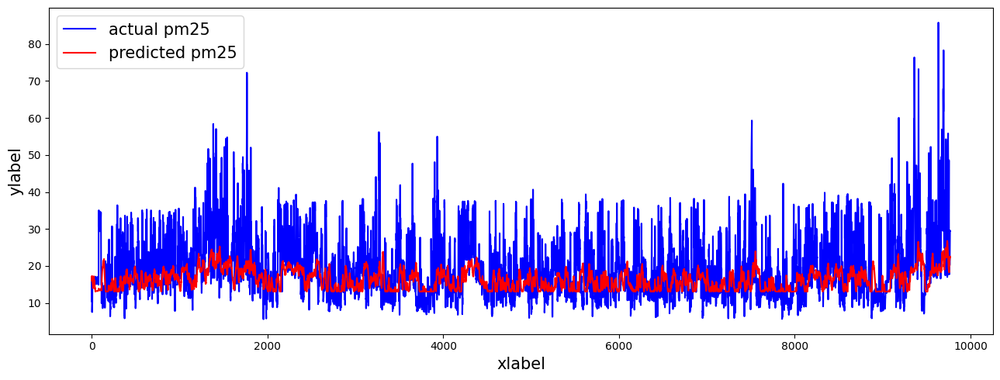

Day = 36
mae: 6.087016421109972
mse: 73.9168310356903
rmse: 8.597489810153327
r2: -6.821586830947821
mape: 0.3791173074530584
mnbe: -14.753834861909384
r_coeff: [0.2566675]


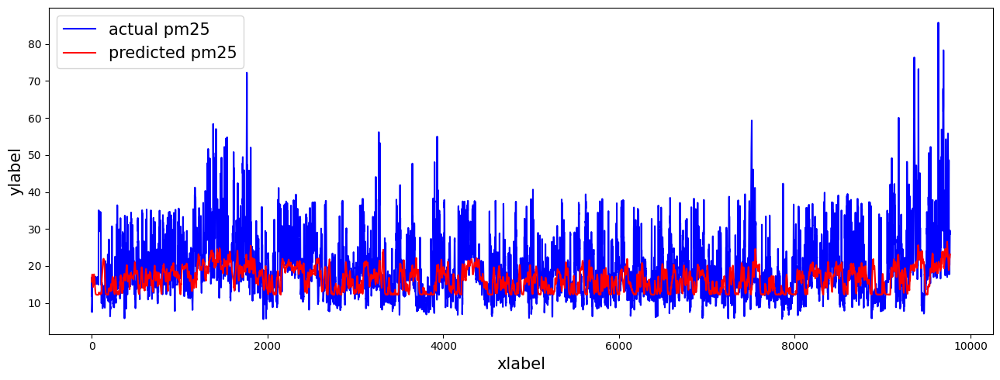

Day = 37
mae: 6.015343280595298
mse: 72.61403066071995
rmse: 8.521386663021456
r2: -7.676196664074469
mape: 0.3709595444313502
mnbe: -14.64606199932036
r_coeff: [0.27507922]


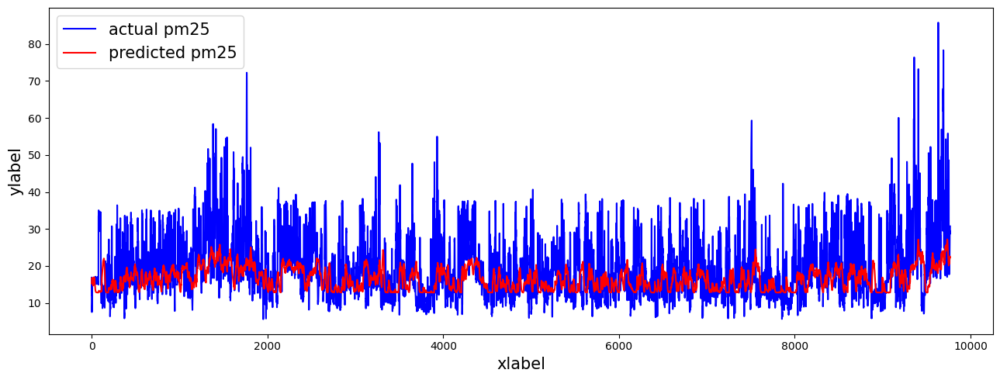

Day = 38
mae: 6.068809237181657
mse: 73.82590167902707
rmse: 8.592200048824926
r2: -7.6671265562011826
mape: 0.37834066991861925
mnbe: -15.230623041589054
r_coeff: [0.26419715]


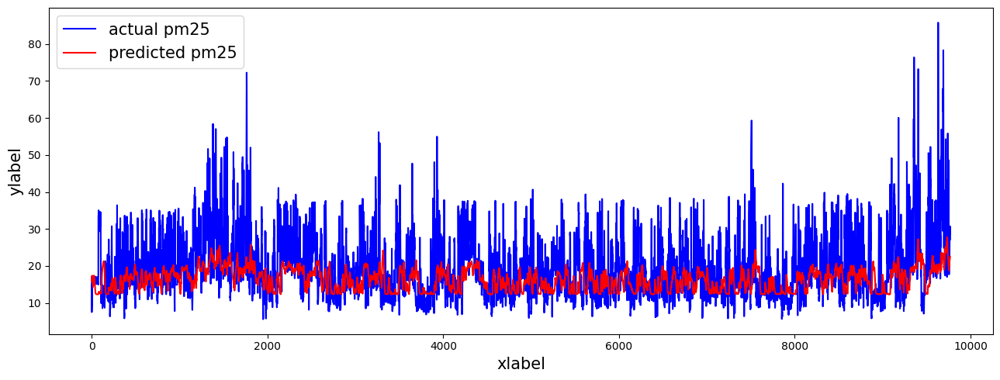

Day = 39
mae: 6.01826083941323
mse: 72.48648618284936
rmse: 8.513899587313052
r2: -7.550119533940842
mape: 0.36933816980888207
mnbe: -14.276733355643689
r_coeff: [0.27006696]


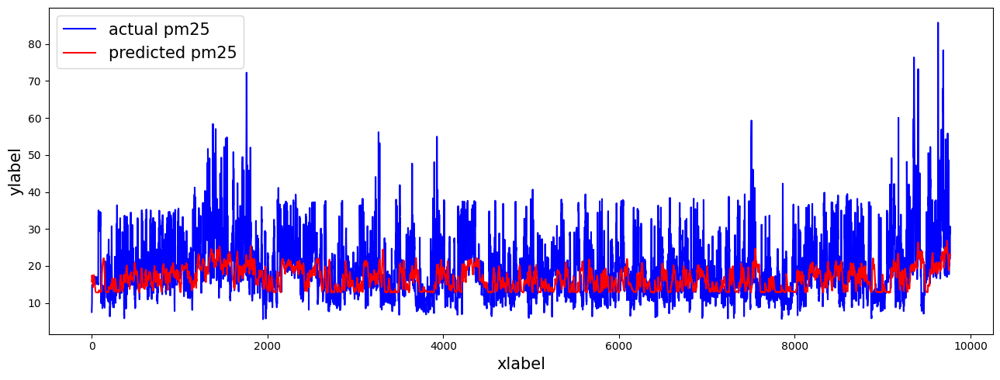

Day = 40
mae: 6.068819590042014
mse: 74.02804638698439
rmse: 8.603955275742917
r2: -7.5326389351219785
mape: 0.37785727503159916
mnbe: -15.336634060531809
r_coeff: [0.26322858]


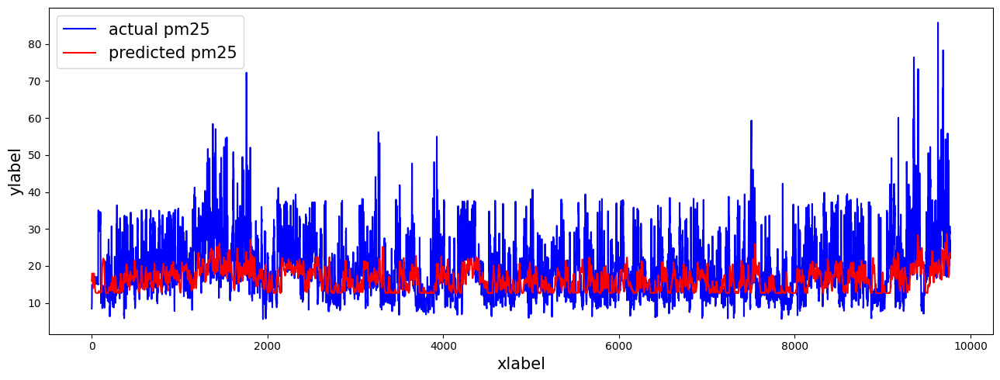

Day = 41
mae: 6.051314502333975
mse: 73.96364590440396
rmse: 8.600211968574028
r2: -8.674003694500962
mape: 0.3766552214644626
mnbe: -15.740744228516615
r_coeff: [0.2695016]


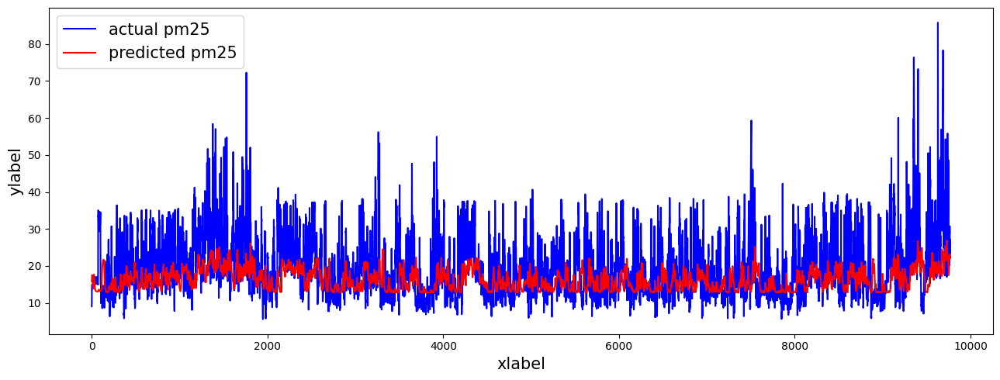

Day = 42
mae: 6.073536378317071
mse: 73.70819318594364
rmse: 8.585347586786666
r2: -7.019603728487935
mape: 0.3767751855465129
mnbe: -14.95483342445948
r_coeff: [0.26399403]


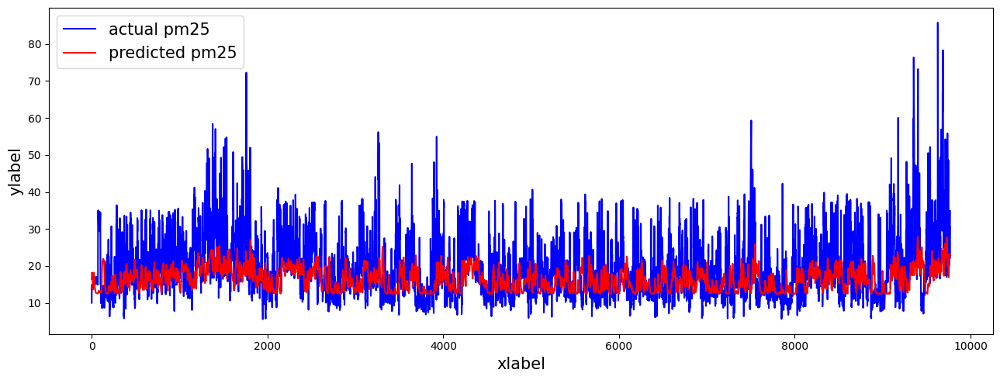

Day = 43
mae: 6.051733348748057
mse: 72.53639375314127
rmse: 8.516830029602637
r2: -6.727201952833819
mape: 0.37086892600464383
mnbe: -14.000509554402784
r_coeff: [0.26832642]


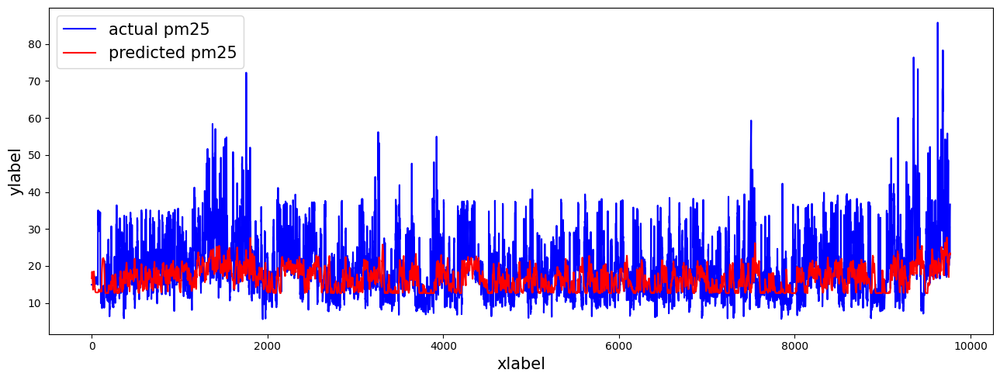

Day = 44
mae: 6.048318613289778
mse: 72.48664845972188
rmse: 8.513909117422024
r2: -6.699747045145698
mape: 0.3702224663732236
mnbe: -14.006233953903166
r_coeff: [0.2704481]


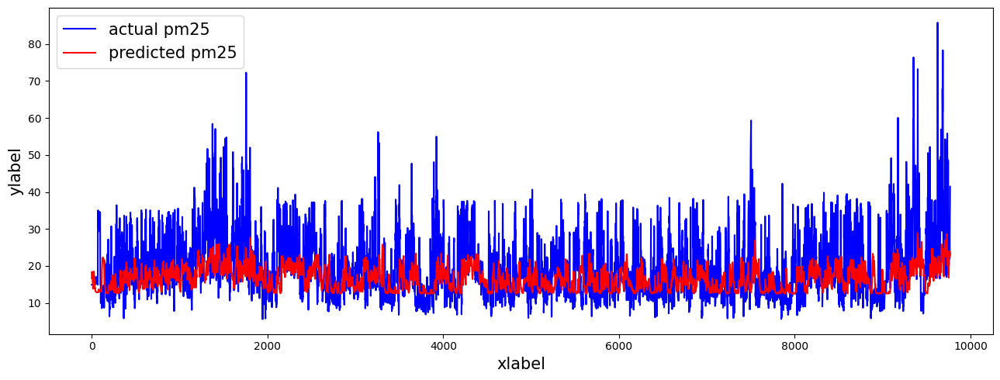

Day = 45
mae: 6.084418306396887
mse: 73.0676060112505
rmse: 8.547959172296654
r2: -6.187050256260147
mape: 0.3744609851696254
mnbe: -14.089174395319096
r_coeff: [0.26680455]


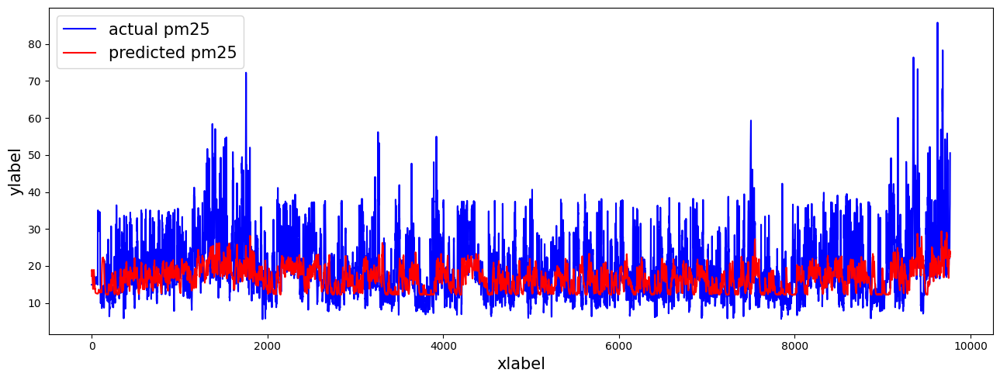

Day = 46
mae: 6.119122539448723
mse: 74.91785854647493
rmse: 8.65551029959961
r2: -6.866975590010272
mape: 0.3844297980267141
mnbe: -15.813863364354406
r_coeff: [0.2668374]


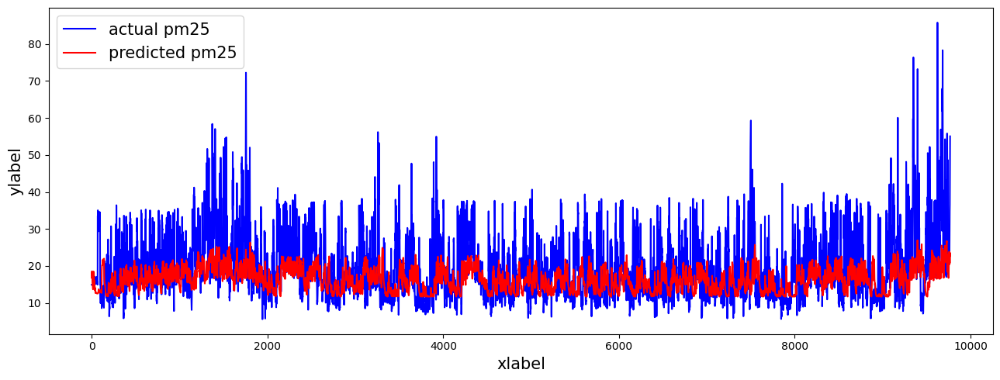

Day = 47
mae: 6.056544409148095
mse: 73.38294825066329
rmse: 8.566384783014554
r2: -7.642537972981572
mape: 0.37303599396867587
mnbe: -14.764263324158774
r_coeff: [0.26846518]


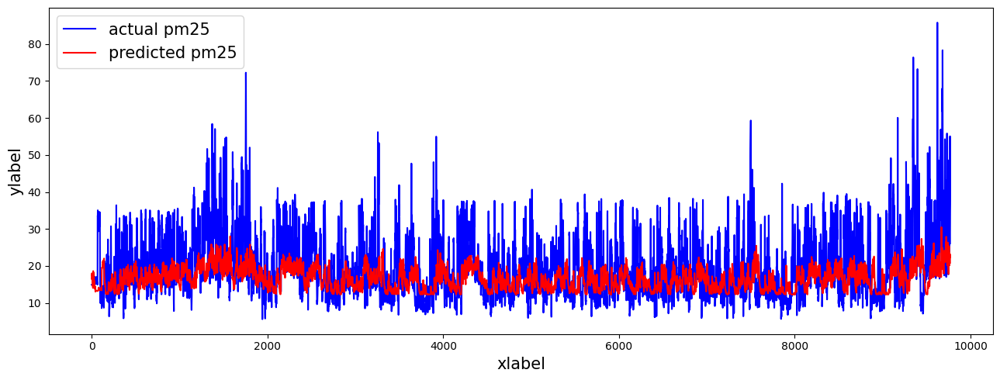

In [12]:
n_future = 48
X_train, y_train, X_test, y_test = X_train_48h, y_train_48h, X_test_48h, y_test_48h

lstms2s_48h = define_lstms2s_model(n_past, n_future, X_train.shape[-1], y_train.shape[-1], f"{label}_lstms2s_{n_future}h")

history = lstms2s_48h.fit(X_train, y_train,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [reduce_lr_callback, early_stopping_callback],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred = lstms2s_48h.predict(X_test)
print(f"y_pred.shape = {y_pred.shape}")

# Save model
lstms2s_48h.save(os.path.join(RESULT_DIR, f"{lstms2s_48h.name}.keras"))

inv_y_pred = np.expand_dims(label_scaler.inverse_transform(y_pred), -1)
inv_y_test = np.expand_dims(label_scaler.inverse_transform(y_test[:, :, 0]), -1)
print(f"inv_y_pred.shape = {inv_y_pred.shape}\ninv_y_test.shape = {inv_y_test.shape}")

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    
    current_day_y_pred, current_day_y_test = inv_y_pred[:, day, :], inv_y_test[:, day, :]
    shifted_inv_y_pred, shifted_inv_y_test = current_day_y_pred[1:], current_day_y_test[:-1]
    
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(shifted_inv_y_pred, shifted_inv_y_test)}")
    plot_2_data(data1=shifted_inv_y_test, datalabel1="actual pm25", data2=shifted_inv_y_pred, datalabel2="predicted pm25")